# Hyperspectral SegFormer MAE Benchmark

Two-pass checkerboard reconstruction on all 4 PRISMA L2D benchmark scenes.
Dual anomaly scoring: L1 (magnitude) + SAM (spectral shape).

### 1. Setup & Load Model

In [1]:
import os, sys, pathlib, json
import numpy as np
import torch
import torch.nn.functional as F
import rasterio
import matplotlib.pyplot as plt
from tqdm import tqdm

PROJECT_ROOT = str(pathlib.Path(os.getcwd()).parents[1])
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

from app.models.file_processing.sources import FileSourceConfig
from app.models.dataset.vendables import BandFilterConfig, DEFAULT_COMMON_WAVELENGTH_GRID
from app.utils.dataset_builder.prisma_dataset_builder import PrismaDatasetBuilder
from app.foundation_models.components.hyperspectral_seg_former_mae import HyperspectralSegFormerMAE
from app.foundation_models.components.token_masking import TokenMasking
from app.utils.patch_generation.generate_patch_plan import PatchPlanGenerator
from app.models.patches.patching_request import PatchRequest
from app.utils.torch_helpers.device_selection import get_device

# ── CONFIG ──
# Paths relative to project root — works locally and on GPU server
CHECKPOINT_PATH = os.path.join(PROJECT_ROOT, "checkpoints", "hyperspectral_segformer_mae_v0.2.0_epoch200.pt")  # UPDATE THIS
PIXEL_STATS_PATH = os.path.join(PROJECT_ROOT,"app","constants", "hyperspectral.json")

DEVICE = get_device()
PATCH_SIZE = 128
STRIDE = 32
INFERENCE_BATCH_SIZE = 16
CHECKERBOARD_CELL_SIZE = 1
EROSION_KERNEL_SIZE = 15
MIN_VALID_FRACTION = 0.1

BENCHMARK_ROOT = os.path.join(PROJECT_ROOT, "benchmarking", "hyperspectral")
DATASET_IDS = [1, 2, 3, 4]

print(f"Device: {DEVICE}")
print(f"Stats:  {PIXEL_STATS_PATH}")
print(f"Ckpt:   {CHECKPOINT_PATH}")

# Load pixel stats
with open(PIXEL_STATS_PATH) as f:
    stats = json.load(f)
pixel_mean = stats["mean"]
pixel_std = stats["std"]
print(f"  {len(pixel_mean)} bands, mean range [{min(pixel_mean):.4f}, {max(pixel_mean):.4f}]")

# Load model
ckpt = torch.load(CHECKPOINT_PATH, map_location=DEVICE, weights_only=False)
model = HyperspectralSegFormerMAE(
    in_channels=165,
    compressed_channels=32,
    embed_dims=[32, 64, 160, 256],
    num_heads=[2, 2, 5, 8],
    reduction_ratios=[8, 4, 2, 1],
    num_blocks=[2, 2, 2, 2],
    decoder_dim=256,
    drop_rate=0.0,
    pixel_mean=pixel_mean,
    pixel_std=pixel_std,
)
model.load_state_dict(ckpt["model_state_dict"])
model.to(DEVICE)
model.eval()

epoch = ckpt.get("epoch", "?")
val_loss = ckpt.get("avg_val_loss", "?")
print(f"Loaded checkpoint: epoch={epoch}, avg_val_loss={val_loss}")
print(f"Parameters: {sum(p.numel() for p in model.parameters()):,}")

Device: mps
Stats:  /Users/ashwinravi/Desktop/Code Repos/hsi-anomaly-foundations-allotrope/app/constants/hyperspectral.json
Ckpt:   /Users/ashwinravi/Desktop/Code Repos/hsi-anomaly-foundations-allotrope/checkpoints/hyperspectral_segformer_mae_v0.2.0_epoch200.pt
  165 bands, mean range [0.0430, 0.2775]
Loaded checkpoint: epoch=200, avg_val_loss=0.04348535519093275
Parameters: 5,506,629


### 2. Two-Pass Reconstruction with Progress

In [2]:
STAGE1_KERNEL = 4
STAGE1_STRIDE = 4
STAGE1_PADDING = 0

def two_pass_reconstruct_batch(model, patches, masks, device, cell_size=1):
    """Two-pass checkerboard reconstruction for a batch of patches."""
    B, C, H, W = patches.shape
    H_t, W_t = H // STAGE1_STRIDE, W // STAGE1_STRIDE

    checker = TokenMasking.checkerboard_token_mask(
        H_t, W_t, cell_size=cell_size, device=device, invert=False
    )
    token_validity = TokenMasking.pixel_mask_to_token_mask(
        masks, kernel_size=STAGE1_KERNEL, stride=STAGE1_STRIDE, padding=STAGE1_PADDING
    )

    # Pass 1: mask black tokens
    pred_mask_1 = token_validity * (1.0 - checker)
    keep_mask_1 = 1.0 - pred_mask_1
    x_hat_1 = model(patches, mask=masks, keep_mask=keep_mask_1)

    # Pass 2: mask white tokens
    pred_mask_2 = token_validity * checker
    keep_mask_2 = 1.0 - pred_mask_2
    x_hat_2 = model(patches, mask=masks, keep_mask=keep_mask_2)

    # Combine: each pixel from the pass where its token was masked
    pass1_px = F.interpolate(
        pred_mask_1.reshape(B, 1, H_t, W_t), size=(H, W), mode="nearest"
    )
    pass2_px = F.interpolate(
        pred_mask_2.reshape(B, 1, H_t, W_t), size=(H, W), mode="nearest"
    )
    recon = x_hat_1 * pass1_px + x_hat_2 * pass2_px
    return recon * masks


@torch.no_grad()
def reconstruct_full_scene(model, scene, mask, device,
                           patch_size=128, stride=64, batch_size=16,
                           cell_size=1, erosion_ks=15, min_valid=0.1):
    """
    Full-scene two-pass reconstruction with tqdm progress.
    Returns (C, H, W) reconstruction.
    """
    scene = scene.to(device)
    mask = mask.to(device)
    C, H, W = scene.shape

    eroded_mask = TokenMasking.erode_mask(
        mask.unsqueeze(0), kernel_size=erosion_ks
    ).squeeze(0)

    plan = PatchPlanGenerator().generate_patching_plan(
        PatchRequest(input_cube=(C, H, W), width=patch_size, height=patch_size, stride=stride)
    )
    coords = plan.patch_coordinates

    recon_sum = torch.zeros(C, H, W, device=device)
    count = torch.zeros(1, H, W, device=device)

    total_batches = (len(coords) + batch_size - 1) // batch_size
    valid_patches = 0
    skipped_patches = 0

    for batch_start in tqdm(range(0, len(coords), batch_size),
                            total=total_batches, desc="Reconstructing", unit="batch"):
        batch_coords = coords[batch_start:batch_start + batch_size]

        all_patches = [scene[:, r:r+patch_size, c:c+patch_size] for r, c in batch_coords]
        all_masks = [mask[:, r:r+patch_size, c:c+patch_size] for r, c in batch_coords]

        # Filter by validity
        valid_idx = [i for i, m in enumerate(all_masks) if m.float().mean() >= min_valid]
        skipped_patches += len(batch_coords) - len(valid_idx)

        if not valid_idx:
            continue

        patches = torch.stack([all_patches[i] for i in valid_idx])
        patch_masks = torch.stack([all_masks[i] for i in valid_idx])

        recon = two_pass_reconstruct_batch(model, patches, patch_masks, device, cell_size)
        valid_patches += len(valid_idx)

        for j, idx in enumerate(valid_idx):
            r, c = batch_coords[idx]
            patch_eroded = eroded_mask[:, r:r+patch_size, c:c+patch_size]
            recon_sum[:, r:r+patch_size, c:c+patch_size] += recon[j] * patch_eroded
            count[:, r:r+patch_size, c:c+patch_size] += patch_eroded

    reconstruction = torch.where(count > 0, recon_sum / count, scene)
    print(f"  {valid_patches} patches reconstructed, {skipped_patches} skipped (<{min_valid*100:.0f}% valid)")
    return reconstruction


def compute_anomaly_scores(original, reconstruction, mask):
    """Compute L1 and SAM anomaly score maps."""
    # L1: mean absolute error across bands
    l1 = (original - reconstruction).abs().mean(dim=0)  # (H, W)

    # SAM: spectral angle in radians
    dot = (original * reconstruction).sum(dim=0, keepdim=True)
    norm_o = (original * original).sum(dim=0, keepdim=True).add(1e-8).sqrt()
    norm_r = (reconstruction * reconstruction).sum(dim=0, keepdim=True).add(1e-8).sqrt()
    cos_sim = (dot / (norm_o * norm_r)).clamp(-1.0, 1.0)
    sam = torch.acos(cos_sim).squeeze(0)  # (H, W)

    spatial_mask = mask[0]  # (H, W)
    l1 = l1 * spatial_mask
    sam = sam * spatial_mask

    return l1.cpu().numpy(), sam.cpu().numpy()


def make_rgb(cube, wl, validity=None):
    r = np.argmin(np.abs(wl - 650)); g = np.argmin(np.abs(wl - 550)); b = np.argmin(np.abs(wl - 450))
    rgb = np.stack([cube[r], cube[g], cube[b]], axis=-1).astype(np.float32)
    for ch in range(3):
        v = rgb[:,:,ch]
        vals = v[validity > 0] if validity is not None else v[v > 0]
        if len(vals) > 0:
            p2, p98 = np.percentile(vals, [2, 98])
            rgb[:,:,ch] = np.clip((v - p2) / (p98 - p2 + 1e-10), 0, 1)
    if validity is not None: rgb[validity == 0] = 0
    return rgb

print("Reconstruction functions ready.")

Reconstruction functions ready.


### 3. Load Scenes, Reconstruct, Score

In [3]:
band_filter_config = BandFilterConfig(common_wavelength_grid=DEFAULT_COMMON_WAVELENGTH_GRID)

datasets = {}
for did in DATASET_IDS:
    folder = os.path.join(BENCHMARK_ROOT, str(did))
    he5_files = [f for f in os.listdir(folder) if f.endswith(".he5")]
    assert len(he5_files) == 1
    he5_path = os.path.join(folder, he5_files[0])
    gt_path = os.path.join(folder, "gt.tif")

    print(f"\n{'='*70}")
    print(f"  Dataset {did}: {he5_files[0][:50]}...")
    print(f"{'='*70}")

    # Build vendable
    print("  Building vendable...")
    builder = PrismaDatasetBuilder(
        file_source_configuration=FileSourceConfig(source_path=he5_path)
    )
    vendable = builder.vend_dataset(band_filter_config=band_filter_config)

    cube = vendable.normalized_hyperspectral_cube   # (165, H, W)
    validity = vendable.validity_cube               # (165, H, W)
    wavelengths = np.array(vendable.band_cw_order)

    with rasterio.open(gt_path) as src:
        gt = (src.read(1) > 0).astype(np.uint8)

    spatial_valid = (validity.sum(axis=0) > 0).astype(np.uint8)  # (H, W)
    C, H, W = cube.shape
    print(f"  Cube: ({C}, {H}, {W}), valid: {spatial_valid.mean()*100:.0f}%, anomalies: {gt.sum():,}")

    # Reconstruct
    scene_tensor = torch.from_numpy(cube).float()
    mask_tensor = torch.from_numpy(spatial_valid[None]).float()  # (1, H, W)

    print(f"  Reconstructing ({PATCH_SIZE}x{PATCH_SIZE}, stride {STRIDE})...")
    recon = reconstruct_full_scene(
        model, scene_tensor, mask_tensor, DEVICE,
        patch_size=PATCH_SIZE, stride=STRIDE, batch_size=INFERENCE_BATCH_SIZE,
        cell_size=CHECKERBOARD_CELL_SIZE, erosion_ks=EROSION_KERNEL_SIZE,
    )

    # Anomaly scores
    l1_map, sam_map = compute_anomaly_scores(scene_tensor.to(DEVICE), recon, mask_tensor.to(DEVICE))

    datasets[did] = {
        "name": he5_files[0].replace(".he5", ""),
        "cube": cube,
        "validity": spatial_valid,
        "wavelengths": wavelengths,
        "gt": gt,
        "recon": recon.cpu().numpy(),
        "l1_map": l1_map,
        "sam_map": sam_map,
    }

    valid_l1 = l1_map[spatial_valid == 1]
    valid_sam = sam_map[spatial_valid == 1]
    print(f"  L1:  mean={valid_l1.mean():.6f}, P99={np.percentile(valid_l1, 99):.6f}")
    print(f"  SAM: mean={valid_sam.mean():.4f} rad ({valid_sam.mean()*180/np.pi:.1f}°), "
          f"P99={np.percentile(valid_sam, 99):.4f} rad ({np.percentile(valid_sam, 99)*180/np.pi:.1f}°)")


  Dataset 1: PRS_L2D_STD_20201214060713_20201214060717_0001.he5...
  Building vendable...
Using device: mps
Using device: mps
  Cube: (165, 1186, 1196), valid: 70%, anomalies: 638
  Reconstructing (128x128, stride 32)...


Reconstructing: 100%|██████████| 77/77 [00:20<00:00,  3.68batch/s]


  1104 patches reconstructed, 121 skipped (<10% valid)
  L1:  mean=0.005907, P99=0.024332
  SAM: mean=0.1159 rad (6.6°), P99=0.3574 rad (20.5°)

  Dataset 2: PRS_L2D_STD_20241205050514_20241205050518_0001.he5...
  Building vendable...
Using device: mps
Using device: mps
  Cube: (165, 1216, 1280), valid: 68%, anomalies: 992
  Reconstructing (128x128, stride 32)...


Reconstructing: 100%|██████████| 86/86 [00:31<00:00,  2.70batch/s]


  1182 patches reconstructed, 186 skipped (<10% valid)
  L1:  mean=0.010201, P99=0.040852
  SAM: mean=0.0405 rad (2.3°), P99=0.1515 rad (8.7°)

  Dataset 3: PRS_L2D_STD_20210516050459_20210516050503_0001.he5...
  Building vendable...
Using device: mps
Using device: mps
  Cube: (165, 1202, 1210), valid: 68%, anomalies: 778
  Reconstructing (128x128, stride 32)...


Reconstructing: 100%|██████████| 77/77 [00:34<00:00,  2.24batch/s]


  1094 patches reconstructed, 131 skipped (<10% valid)
  L1:  mean=0.013075, P99=0.054652
  SAM: mean=0.0467 rad (2.7°), P99=0.2336 rad (13.4°)

  Dataset 4: PRS_L2D_STD_20231229050902_20231229050907_0001.he5...
  Building vendable...
Using device: mps
Using device: mps
  Cube: (165, 1210, 1219), valid: 68%, anomalies: 1,165
  Reconstructing (128x128, stride 32)...


Reconstructing: 100%|██████████| 79/79 [00:35<00:00,  2.25batch/s]


  1112 patches reconstructed, 148 skipped (<10% valid)
  L1:  mean=0.015572, P99=0.033041
  SAM: mean=0.0673 rad (3.9°), P99=0.1754 rad (10.0°)


### 4. Anomaly Score Maps (L1 + SAM)

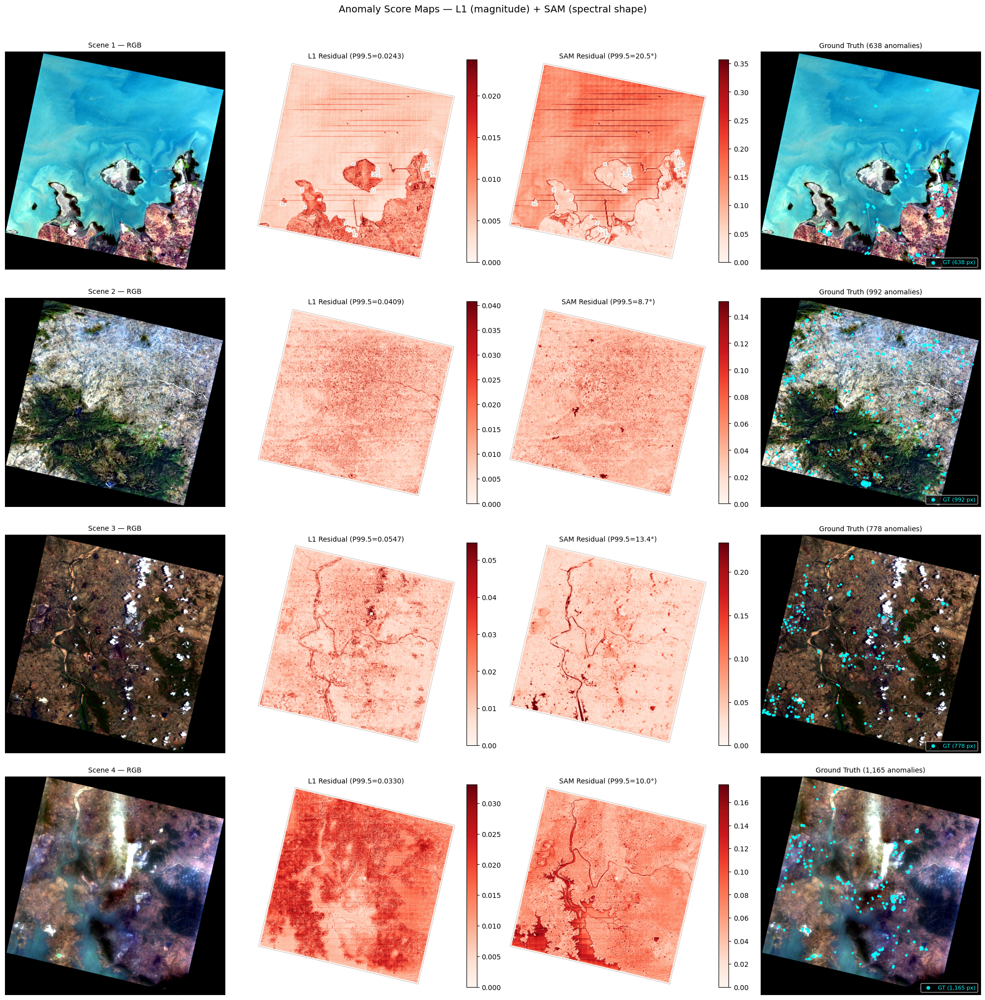

In [4]:
fig, axes = plt.subplots(4, 4, figsize=(20, 20))

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    sv = d["validity"]
    wl = d["wavelengths"]

    # Col 0: RGB
    rgb = make_rgb(d["cube"], wl, sv)
    axes[idx, 0].imshow(rgb)
    axes[idx, 0].set_title(f"Scene {did} — RGB", fontsize=10)
    axes[idx, 0].axis("off")

    # Col 1: L1 anomaly map
    l1_valid = d["l1_map"][sv == 1]
    clip_l1 = np.percentile(l1_valid, 99)
    l1_display = np.ma.masked_where(sv == 0, d["l1_map"])
    im1 = axes[idx, 1].imshow(l1_display, cmap="Reds", vmin=0, vmax=clip_l1)
    axes[idx, 1].set_title(f"L1 Residual (P99.5={clip_l1:.4f})", fontsize=10)
    axes[idx, 1].axis("off")
    plt.colorbar(im1, ax=axes[idx, 1], fraction=0.046)

    # Col 2: SAM anomaly map
    sam_valid = d["sam_map"][sv == 1]
    clip_sam = np.percentile(sam_valid, 99)
    sam_display = np.ma.masked_where(sv == 0, d["sam_map"])
    im2 = axes[idx, 2].imshow(sam_display, cmap="Reds", vmin=0, vmax=clip_sam)
    axes[idx, 2].set_title(f"SAM Residual (P99.5={clip_sam*180/np.pi:.1f}°)", fontsize=10)
    axes[idx, 2].axis("off")
    plt.colorbar(im2, ax=axes[idx, 2], fraction=0.046)

    # Col 3: GT overlay on RGB
    axes[idx, 3].imshow(rgb)
    gt_rows, gt_cols = np.where(d["gt"] > 0)
    axes[idx, 3].scatter(gt_cols, gt_rows, c="cyan", s=6, marker="o",
                         linewidths=0.5, edgecolors="cyan", alpha=0.9,
                         label=f"GT ({len(gt_rows):,} px)")
    axes[idx, 3].set_title(f"Ground Truth ({len(gt_rows):,} anomalies)", fontsize=10)
    axes[idx, 3].axis("off")
    axes[idx, 3].legend(loc="lower right", fontsize=8, markerscale=2,
                        framealpha=0.8, facecolor="black", labelcolor="cyan")

plt.suptitle("Anomaly Score Maps — L1 (magnitude) + SAM (spectral shape)", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

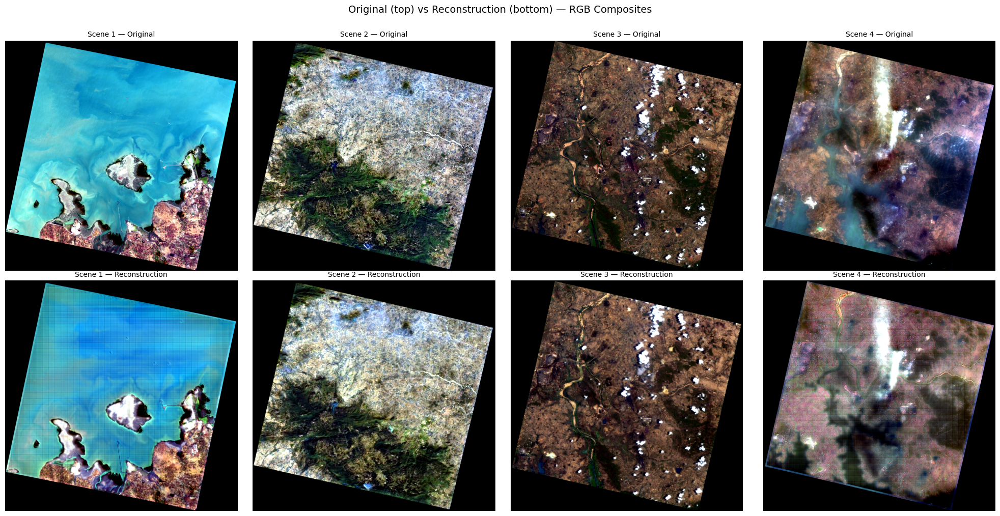

In [5]:
# Original vs Reconstructed RGB (2x4 grid)
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    sv = d["validity"]
    wl = d["wavelengths"]

    rgb_orig = make_rgb(d["cube"], wl, sv)
    rgb_recon = make_rgb(d["recon"], wl, sv)

    axes[0, idx].imshow(rgb_orig)
    axes[0, idx].set_title(f"Scene {did} — Original", fontsize=10)
    axes[0, idx].axis("off")

    axes[1, idx].imshow(rgb_recon)
    axes[1, idx].set_title(f"Scene {did} — Reconstruction", fontsize=10)
    axes[1, idx].axis("off")

plt.suptitle("Original (top) vs Reconstruction (bottom) — RGB Composites", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


### 5. ROC & AUC (L1, SAM, Combined)

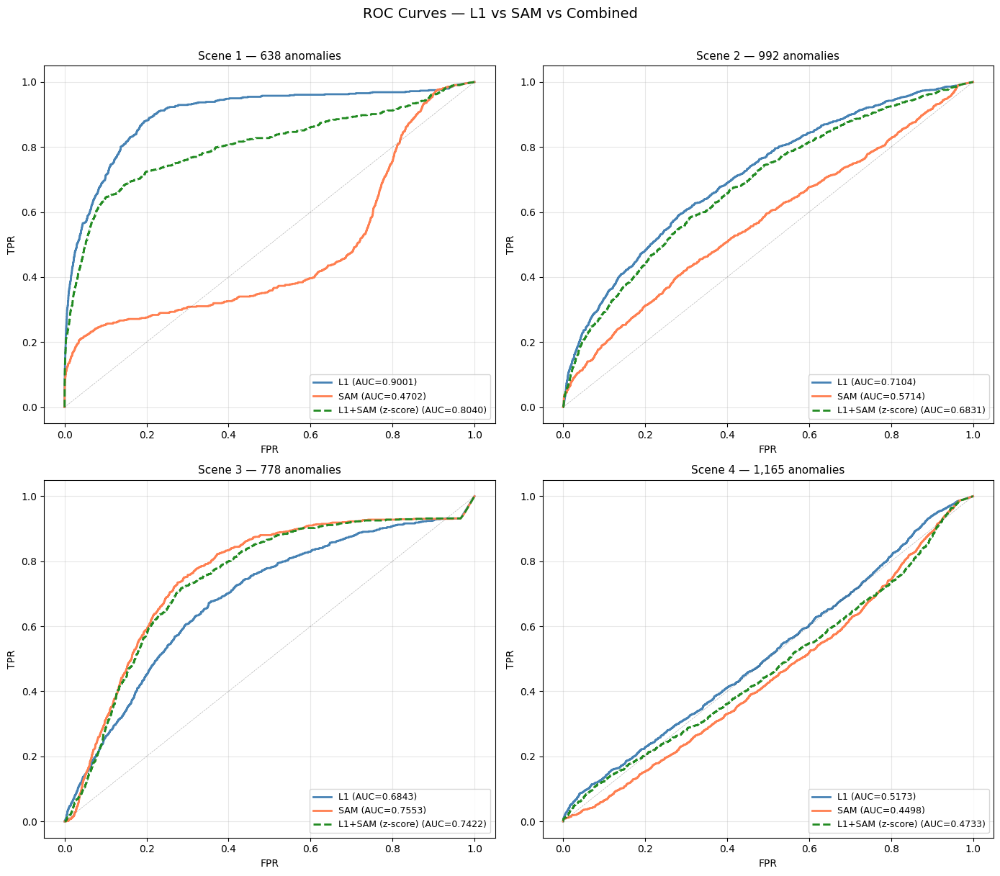

In [6]:
from sklearn.metrics import roc_curve, auc

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    sv = d["validity"]
    gt = d["gt"]

    valid_mask = sv.astype(bool).ravel()
    gt_flat = gt.ravel()[valid_mask].astype(int)

    l1_flat = d["l1_map"].ravel()[valid_mask]
    sam_flat = d["sam_map"].ravel()[valid_mask]

    # Normalize for combination: z-score each, then sum
    l1_z = (l1_flat - l1_flat.mean()) / (l1_flat.std() + 1e-8)
    sam_z = (sam_flat - sam_flat.mean()) / (sam_flat.std() + 1e-8)
    combined = l1_z + sam_z

    results = {}
    for label, scores, color, ls in [
        ("L1", l1_flat, "steelblue", "-"),
        ("SAM", sam_flat, "coral", "-"),
        ("L1+SAM (z-score)", combined, "forestgreen", "--"),
    ]:
        fpr, tpr, _ = roc_curve(gt_flat, scores)
        roc_auc = auc(fpr, tpr)
        axes[idx].plot(fpr, tpr, color=color, lw=2, linestyle=ls,
                       label=f"{label} (AUC={roc_auc:.4f})")
        results[label] = roc_auc

    axes[idx].plot([0, 1], [0, 1], "k--", lw=0.5, alpha=0.3)
    axes[idx].set_xlabel("FPR"); axes[idx].set_ylabel("TPR")
    axes[idx].set_title(f"Scene {did} — {gt.sum():,} anomalies", fontsize=11)
    axes[idx].legend(fontsize=9, loc="lower right")
    axes[idx].grid(True, alpha=0.3)

    d["auc_l1"] = results["L1"]
    d["auc_sam"] = results["SAM"]
    d["auc_combined"] = results["L1+SAM (z-score)"]

plt.suptitle("ROC Curves — L1 vs SAM vs Combined", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

### 6. Spectral Reconstruction at Anomaly Pixels

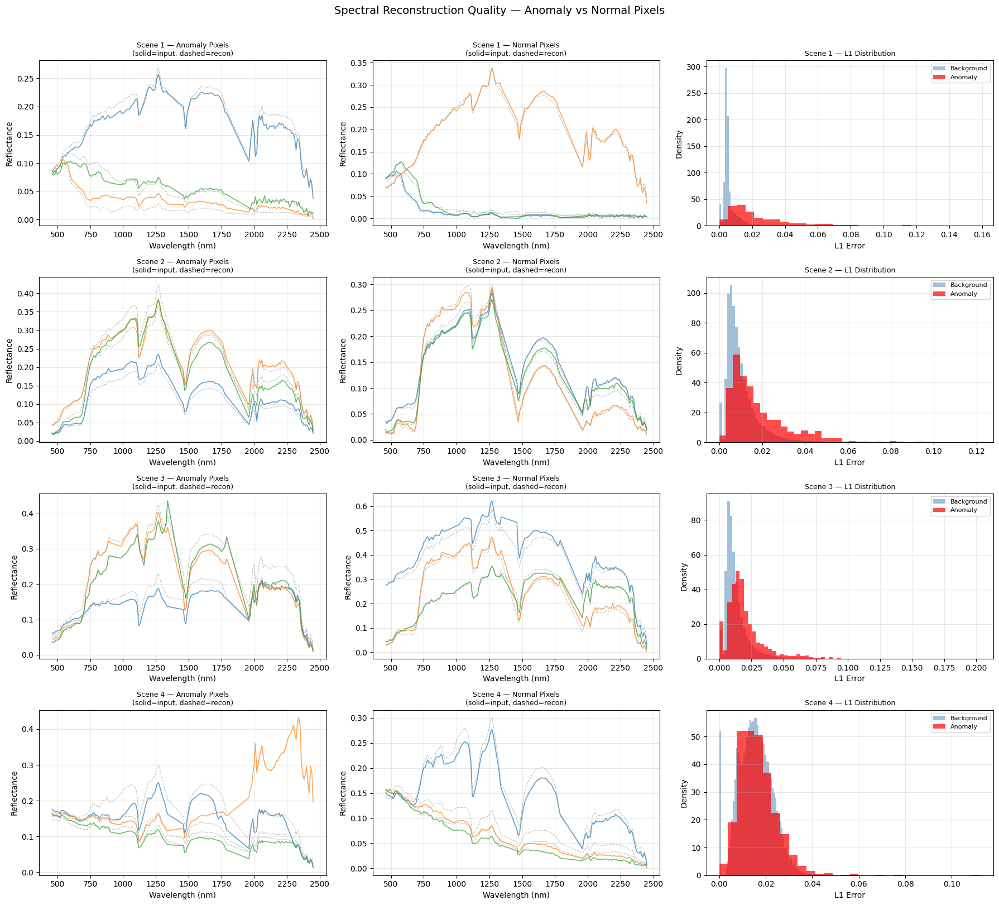

In [7]:
fig, axes = plt.subplots(4, 3, figsize=(18, 16))

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    wl = d["wavelengths"]
    sv = d["validity"]
    gt = d["gt"]
    cube = d["cube"]
    recon = d["recon"]

    # Find anomaly pixels on valid regions
    anom_valid = np.argwhere((gt > 0) & (sv == 1))
    # Find normal pixels nearby
    normal_valid = np.argwhere((gt == 0) & (sv == 1))

    rng = np.random.default_rng(42)

    # Col 0: Anomaly pixel spectra (input vs recon)
    if len(anom_valid) > 0:
        sample_anom = anom_valid[rng.choice(len(anom_valid), min(3, len(anom_valid)), replace=False)]
        for r, c in sample_anom:
            axes[idx, 0].plot(wl, cube[:, r, c], lw=1.2, alpha=0.7)
            axes[idx, 0].plot(wl, recon[:, r, c], lw=0.8, alpha=0.5, linestyle="--", color="gray")
    axes[idx, 0].set_xlabel("Wavelength (nm)")
    axes[idx, 0].set_ylabel("Reflectance")
    axes[idx, 0].set_title(f"Scene {did} — Anomaly Pixels\n(solid=input, dashed=recon)", fontsize=9)
    axes[idx, 0].grid(True, alpha=0.3)

    # Col 1: Normal pixel spectra (input vs recon)
    sample_norm = normal_valid[rng.choice(len(normal_valid), 3, replace=False)]
    for r, c in sample_norm:
        axes[idx, 1].plot(wl, cube[:, r, c], lw=1.2, alpha=0.7)
        axes[idx, 1].plot(wl, recon[:, r, c], lw=0.8, alpha=0.5, linestyle="--", color="gray")
    axes[idx, 1].set_xlabel("Wavelength (nm)")
    axes[idx, 1].set_ylabel("Reflectance")
    axes[idx, 1].set_title(f"Scene {did} — Normal Pixels\n(solid=input, dashed=recon)", fontsize=9)
    axes[idx, 1].grid(True, alpha=0.3)

    # Col 2: L1 histogram — anomaly vs background
    l1_anom = d["l1_map"][(gt > 0) & (sv == 1)]
    l1_norm = d["l1_map"][(gt == 0) & (sv == 1)]
    if len(l1_norm) > 50000:
        l1_norm = rng.choice(l1_norm, 50000, replace=False)
    axes[idx, 2].hist(l1_norm, bins=100, alpha=0.5, color="steelblue", label="Background", density=True)
    if len(l1_anom) > 0:
        axes[idx, 2].hist(l1_anom, bins=30, alpha=0.7, color="red", label="Anomaly", density=True)
    axes[idx, 2].set_xlabel("L1 Error")
    axes[idx, 2].set_ylabel("Density")
    axes[idx, 2].set_title(f"Scene {did} — L1 Distribution", fontsize=9)
    axes[idx, 2].legend(fontsize=8)
    axes[idx, 2].grid(True, alpha=0.3)

plt.suptitle("Spectral Reconstruction Quality — Anomaly vs Normal Pixels", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

### 7. Summary Table

In [8]:
print(f"{'='*90}")
print(f"{'HYPERSPECTRAL SEGFORMER MAE BENCHMARK RESULTS':^90}")
print(f"{'='*90}")
print(f"  Checkpoint: epoch {epoch}, val_loss={val_loss}")
print(f"  Patch: {PATCH_SIZE}x{PATCH_SIZE}, stride {STRIDE}, cell_size {CHECKERBOARD_CELL_SIZE}")
print()
print(f"{'Metric':<30} {'Scene 1':>12} {'Scene 2':>12} {'Scene 3':>12} {'Scene 4':>12}")
print(f"{'-'*78}")

for label, key_fn in [
    ("AUC-ROC (L1)", lambda d: f"{d['auc_l1']:.4f}"),
    ("AUC-ROC (SAM)", lambda d: f"{d['auc_sam']:.4f}"),
    ("AUC-ROC (Combined)", lambda d: f"{d['auc_combined']:.4f}"),
    ("Mean L1", lambda d: f"{d['l1_map'][d['validity']==1].mean():.6f}"),
    ("Mean SAM (deg)", lambda d: f"{d['sam_map'][d['validity']==1].mean()*180/np.pi:.2f}"),
    ("GT Anomalies", lambda d: f"{d['gt'].sum():,}"),
    ("Valid Pixels", lambda d: f"{d['validity'].sum():,}"),
]:
    vals = [key_fn(datasets[did]) for did in DATASET_IDS]
    print(f"{label:<30} {vals[0]:>12} {vals[1]:>12} {vals[2]:>12} {vals[3]:>12}")

                      HYPERSPECTRAL SEGFORMER MAE BENCHMARK RESULTS                       
  Checkpoint: epoch 200, val_loss=0.04348535519093275
  Patch: 128x128, stride 32, cell_size 1

Metric                              Scene 1      Scene 2      Scene 3      Scene 4
------------------------------------------------------------------------------
AUC-ROC (L1)                         0.9001       0.7104       0.6843       0.5173
AUC-ROC (SAM)                        0.4702       0.5714       0.7553       0.4498
AUC-ROC (Combined)                   0.8040       0.6831       0.7422       0.4733
Mean L1                            0.005907     0.010201     0.013075     0.015572
Mean SAM (deg)                         6.64         2.32         2.68         3.86
GT Anomalies                            638          992          778        1,165
Valid Pixels                        992,708    1,050,895      995,483    1,005,979


### 8. Interactive Threshold Explorer

Use the sliders to adjust the percentile threshold for L1 and SAM anomaly detection.
Detected pixels (above threshold) shown in red, GT anomalies in cyan.

In [9]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Precompute RGB composites and percentile lookups for speed
for did in DATASET_IDS:
    d = datasets[did]
    d["_rgb"] = make_rgb(d["cube"], d["wavelengths"], d["validity"])
    sv = d["validity"]
    d["_l1_valid"] = np.sort(d["l1_map"][sv == 1])
    d["_sam_valid"] = np.sort(d["sam_map"][sv == 1])

scene_selector = widgets.Dropdown(options=[(f"Scene {did}", did) for did in DATASET_IDS], value=1, description="Scene:")
l1_slider = widgets.FloatSlider(value=99.0, min=80.0, max=99.99, step=0.1, description="L1 Percentile:", style={"description_width": "initial"}, layout=widgets.Layout(width="400px"))
sam_slider = widgets.FloatSlider(value=99.0, min=80.0, max=99.99, step=0.1, description="SAM Percentile:", style={"description_width": "initial"}, layout=widgets.Layout(width="400px"))

output = widgets.Output()

def update_plot(change=None):
    did = scene_selector.value
    d = datasets[did]
    sv = d["validity"]
    gt = d["gt"]
    rgb = d["_rgb"]

    # Compute thresholds from percentile
    l1_pct = l1_slider.value
    sam_pct = sam_slider.value
    l1_sorted = d["_l1_valid"]
    sam_sorted = d["_sam_valid"]
    l1_thresh = l1_sorted[min(int(len(l1_sorted) * l1_pct / 100), len(l1_sorted) - 1)]
    sam_thresh = sam_sorted[min(int(len(sam_sorted) * sam_pct / 100), len(sam_sorted) - 1)]

    # Detected pixels
    l1_detected = (d["l1_map"] > l1_thresh) & (sv == 1)
    sam_detected = (d["sam_map"] > sam_thresh) & (sv == 1)

    gt_rows, gt_cols = np.where(gt > 0)
    l1_det_rows, l1_det_cols = np.where(l1_detected)
    sam_det_rows, sam_det_cols = np.where(sam_detected)

    # Precision/recall for L1
    l1_tp = ((l1_detected) & (gt > 0)).sum()
    l1_fp = ((l1_detected) & (gt == 0)).sum()
    l1_fn = ((~l1_detected) & (gt > 0) & (sv == 1)).sum()
    l1_prec = l1_tp / max(l1_tp + l1_fp, 1)
    l1_rec = l1_tp / max(l1_tp + l1_fn, 1)

    # Precision/recall for SAM
    sam_tp = ((sam_detected) & (gt > 0)).sum()
    sam_fp = ((sam_detected) & (gt == 0)).sum()
    sam_fn = ((~sam_detected) & (gt > 0) & (sv == 1)).sum()
    sam_prec = sam_tp / max(sam_tp + sam_fp, 1)
    sam_rec = sam_tp / max(sam_tp + sam_fn, 1)

    with output:
        clear_output(wait=True)
        fig, axes = plt.subplots(1, 3, figsize=(21, 7))

        # Col 0: GT on RGB
        axes[0].imshow(rgb)
        axes[0].scatter(gt_cols, gt_rows, c="cyan", s=20, marker="o", alpha=0.8, linewidths=0.3, edgecolors="cyan")
        axes[0].set_title(f"Scene {did} — Ground Truth ({len(gt_rows):,} anomalies)", fontsize=11)
        axes[0].axis("off")

        # Col 1: L1 detections
        axes[1].imshow(rgb)
        axes[1].scatter(gt_cols, gt_rows, c="cyan", s=20, marker="o", alpha=0.8, linewidths=0.3, edgecolors="cyan")
        axes[1].scatter(l1_det_cols, l1_det_rows, c="red", s=10, marker="s", alpha=0.6, linewidths=0)
        axes[1].set_title(
            f"L1 Detections @ P{l1_pct:.1f} (thresh={l1_thresh:.5f})\n"
            f"Detected: {l1_detected.sum():,}  |  Prec: {l1_prec:.3f}  Rec: {l1_rec:.3f}",
            fontsize=10)
        axes[1].axis("off")

        # Col 2: SAM detections
        axes[2].imshow(rgb)
        axes[2].scatter(gt_cols, gt_rows, c="cyan", s=20, marker="o", alpha=0.8, linewidths=0.3, edgecolors="cyan")
        axes[2].scatter(sam_det_cols, sam_det_rows, c="red", s=10, marker="s", alpha=0.6, linewidths=0)
        axes[2].set_title(
            f"SAM Detections @ P{sam_pct:.1f} (thresh={sam_thresh*180/np.pi:.2f}°)\n"
            f"Detected: {sam_detected.sum():,}  |  Prec: {sam_prec:.3f}  Rec: {sam_rec:.3f}",
            fontsize=10)
        axes[2].axis("off")

        plt.suptitle("cyan = GT anomalies  |  red = detected above threshold", fontsize=12, y=1.01)
        plt.tight_layout()
        plt.show()

# Wire up
scene_selector.observe(update_plot, names="value")
l1_slider.observe(update_plot, names="value")
sam_slider.observe(update_plot, names="value")

display(widgets.HBox([scene_selector, l1_slider, sam_slider]))
display(output)
update_plot()

Output()

### 9. Spectral Index Masking — Eliminate Water, Cloud, Shadow

Compute NDVI, NDWI, and brightness from the original reflectance cube.
Mask out pixels that are inherently spectrally distinct (water, cloud remnants, deep shadows)
before computing anomaly metrics. These produce high reconstruction error but aren't real anomalies.

In [10]:
# ---- Spectral index computation ----
# Find nearest bands on the common grid
def find_band(wl, target):
    return np.argmin(np.abs(wl - target))

# Thresholds (configurable)
NDWI_WATER_THRESH = 0.3
BRIGHTNESS_CLOUD_THRESH = 0.4
BRIGHTNESS_SHADOW_THRESH = 0.02
NDVI_VEG_THRESH = 0.4

for did in DATASET_IDS:
    d = datasets[did]
    cube = d['cube']  # (165, H, W)
    wl = d['wavelengths']
    sv = d['validity']

    # Band indices
    b_red = find_band(wl, 660)
    b_nir = find_band(wl, 860)
    b_green = find_band(wl, 560)

    red = cube[b_red].astype(np.float32)
    nir = cube[b_nir].astype(np.float32)
    green = cube[b_green].astype(np.float32)

    # NDVI = (NIR - Red) / (NIR + Red)
    ndvi = (nir - red) / (nir + red + 1e-8)
    ndvi[sv == 0] = 0

    # NDWI = (Green - NIR) / (Green + NIR)
    ndwi = (green - nir) / (green + nir + 1e-8)
    ndwi[sv == 0] = 0

    # Brightness = mean VNIR reflectance (460-910nm)
    vnir_end = find_band(wl, 910)
    brightness = cube[:vnir_end+1].mean(axis=0)
    brightness[sv == 0] = 0

    # Masks
    water_mask = ndwi > NDWI_WATER_THRESH
    cloud_mask = brightness > BRIGHTNESS_CLOUD_THRESH
    shadow_mask = brightness < BRIGHTNESS_SHADOW_THRESH
    veg_mask = ndvi > NDVI_VEG_THRESH
    exclusion_mask = (water_mask | cloud_mask | shadow_mask | veg_mask) & (sv == 1)

    # Masked anomaly scores
    keep_mask = (sv == 1) & (~exclusion_mask)
    d['ndvi'] = ndvi
    d['ndwi'] = ndwi
    d['brightness'] = brightness
    d['exclusion_mask'] = exclusion_mask
    d['keep_mask'] = keep_mask
    d['l1_masked'] = d['l1_map'] * keep_mask
    d['sam_masked'] = d['sam_map'] * keep_mask

    n_excluded = exclusion_mask.sum()
    n_water = (water_mask & (sv == 1)).sum()
    n_cloud = (cloud_mask & (sv == 1)).sum()
    n_shadow = (shadow_mask & (sv == 1)).sum()
    n_veg = (veg_mask & (sv == 1)).sum()
    print(f'Scene {did}: excluded {n_excluded:,} pixels '
          f'(water={n_water:,}, cloud={n_cloud:,}, shadow={n_shadow:,}, veg={n_veg:,}) '
          f'of {sv.sum():,} valid ({n_excluded/sv.sum()*100:.1f}%)')


Scene 1: excluded 828,697 pixels (water=752,429, cloud=36, shadow=1,509, veg=75,727) of 992,708 valid (83.5%)
Scene 2: excluded 839,900 pixels (water=493, cloud=0, shadow=847, veg=838,636) of 1,050,895 valid (79.9%)
Scene 3: excluded 603,342 pixels (water=1,028, cloud=11,244, shadow=318, veg=590,989) of 995,483 valid (60.6%)
Scene 4: excluded 4,890 pixels (water=1,122, cloud=70, shadow=1,064, veg=3,489) of 1,005,979 valid (0.5%)


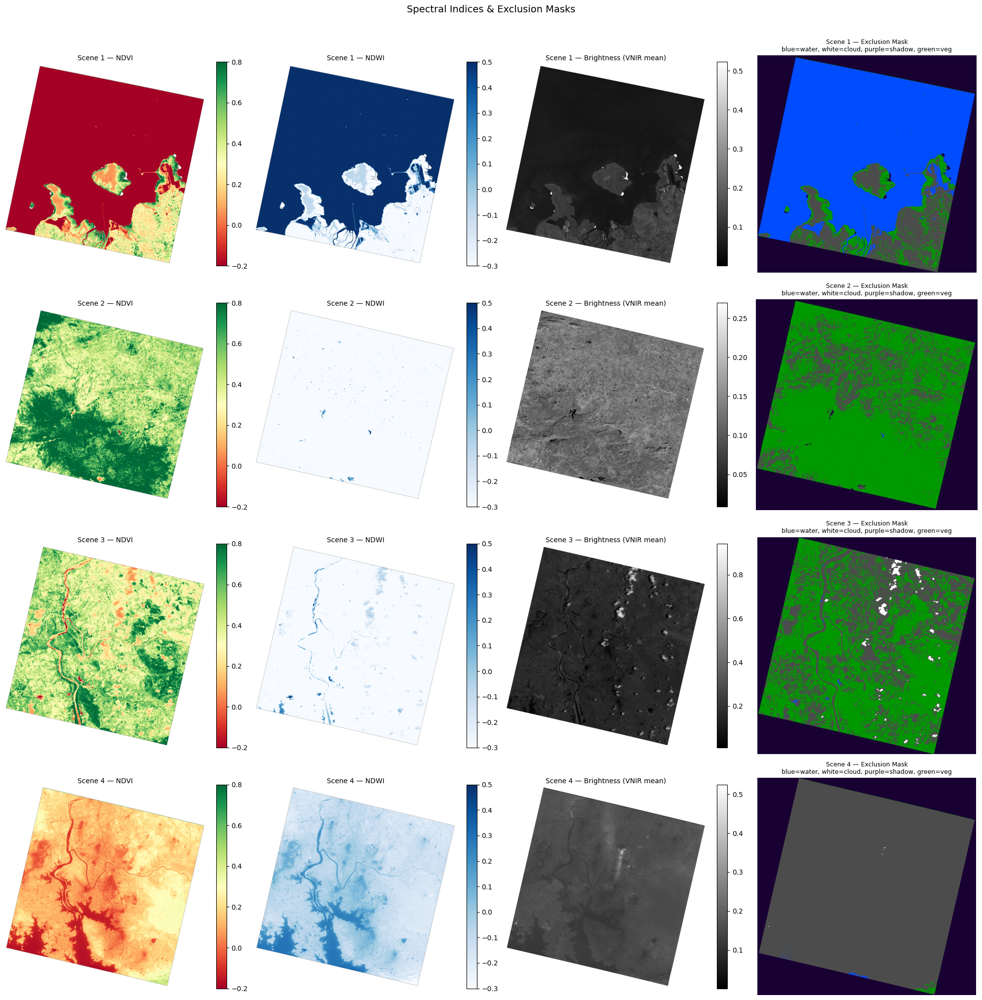

In [11]:
fig, axes = plt.subplots(4, 4, figsize=(20, 20))

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    sv = d['validity']

    # NDVI
    im0 = axes[idx, 0].imshow(np.ma.masked_where(sv == 0, d['ndvi']), cmap='RdYlGn', vmin=-0.2, vmax=0.8)
    axes[idx, 0].set_title(f'Scene {did} — NDVI', fontsize=10)
    axes[idx, 0].axis('off')
    plt.colorbar(im0, ax=axes[idx, 0], fraction=0.046)

    # NDWI
    im1 = axes[idx, 1].imshow(np.ma.masked_where(sv == 0, d['ndwi']), cmap='Blues', vmin=-0.3, vmax=0.5)
    axes[idx, 1].set_title(f'Scene {did} — NDWI', fontsize=10)
    axes[idx, 1].axis('off')
    plt.colorbar(im1, ax=axes[idx, 1], fraction=0.046)

    # Brightness
    im2 = axes[idx, 2].imshow(np.ma.masked_where(sv == 0, d['brightness']), cmap='gray')
    axes[idx, 2].set_title(f'Scene {did} — Brightness (VNIR mean)', fontsize=10)
    axes[idx, 2].axis('off')
    plt.colorbar(im2, ax=axes[idx, 2], fraction=0.046)

    # Exclusion mask
    excl_display = np.zeros((*sv.shape, 3))
    excl_display[d['keep_mask']] = [0.3, 0.3, 0.3]  # kept = gray
    excl_display[d['ndwi'] > NDWI_WATER_THRESH] = [0, 0.3, 1]  # water = blue
    excl_display[d['brightness'] > BRIGHTNESS_CLOUD_THRESH] = [1, 1, 1]  # cloud = white
    excl_display[d['brightness'] < BRIGHTNESS_SHADOW_THRESH] = [0.1, 0, 0.2]  # shadow = purple
    excl_display[d['ndvi'] > NDVI_VEG_THRESH] = [0, 0.6, 0]  # vegetation = green
    axes[idx, 3].imshow(excl_display)
    axes[idx, 3].set_title(f'Scene {did} — Exclusion Mask\nblue=water, white=cloud, purple=shadow, green=veg', fontsize=9)
    axes[idx, 3].axis('off')

plt.suptitle('Spectral Indices & Exclusion Masks', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


### 10. ROC & AUC After Masking

Recompute ROC curves using only the kept pixels (water/cloud/shadow excluded).
Compare with the unmasked results to see if masking improves detection.

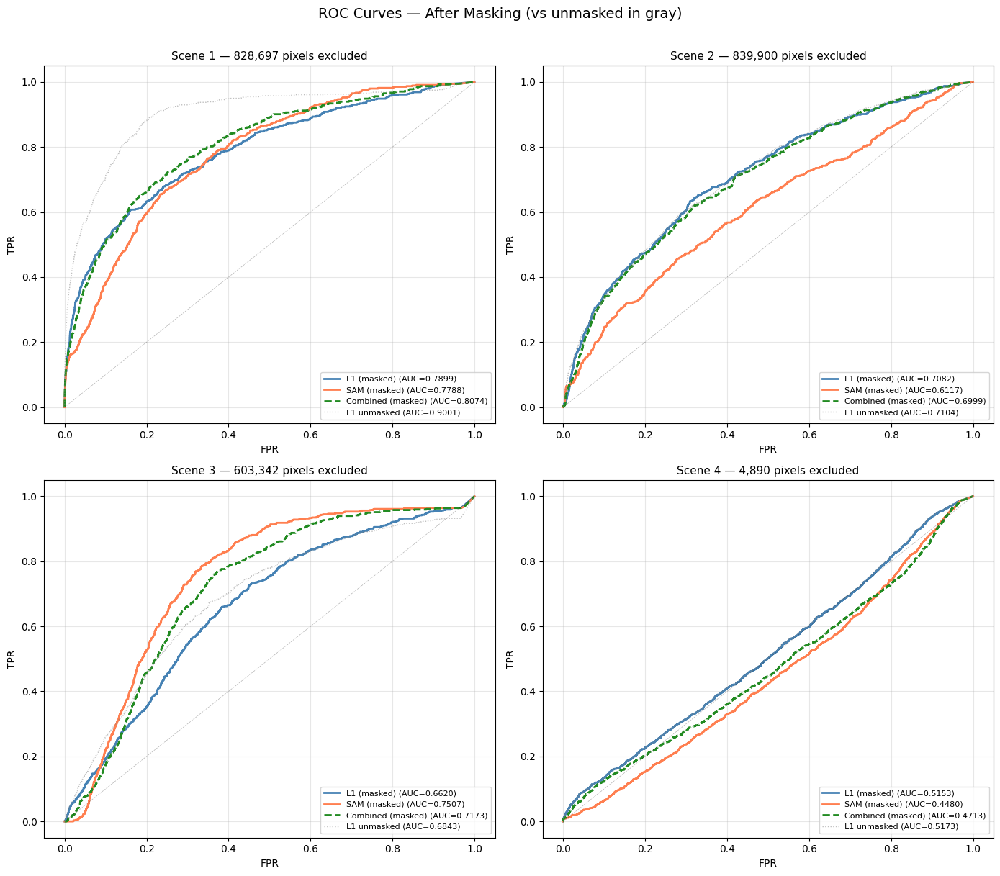

In [12]:
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    gt = d['gt']
    keep = d['keep_mask']

    # Boolean mask — same for all arrays
    keep_bool = keep.astype(bool).ravel()
    gt_flat = gt.ravel()[keep_bool].astype(int)
    l1_flat = d['l1_map'].ravel()[keep_bool]
    sam_flat = d['sam_map'].ravel()[keep_bool]

    l1_z = (l1_flat - l1_flat.mean()) / (l1_flat.std() + 1e-8)
    sam_z = (sam_flat - sam_flat.mean()) / (sam_flat.std() + 1e-8)
    combined = l1_z + sam_z

    for label, scores, color, ls in [
        ('L1 (masked)', l1_flat, 'steelblue', '-'),
        ('SAM (masked)', sam_flat, 'coral', '-'),
        ('Combined (masked)', combined, 'forestgreen', '--'),
    ]:
        fpr, tpr, _ = roc_curve(gt_flat, scores)
        roc_auc = auc(fpr, tpr)
        axes[idx].plot(fpr, tpr, color=color, lw=2, linestyle=ls,
                       label=f'{label} (AUC={roc_auc:.4f})')

    # Overlay unmasked for comparison (dashed, thin)
    sv = d['validity']
    sv_bool = sv.astype(bool).ravel()
    gt_unmasked = gt.ravel()[sv_bool].astype(int)
    l1_unmasked = d['l1_map'].ravel()[sv_bool]
    fpr_u, tpr_u, _ = roc_curve(gt_unmasked, l1_unmasked)
    axes[idx].plot(fpr_u, tpr_u, color='gray', lw=1, linestyle=':', alpha=0.5,
                   label=f'L1 unmasked (AUC={auc(fpr_u, tpr_u):.4f})')

    axes[idx].plot([0, 1], [0, 1], 'k--', lw=0.5, alpha=0.3)
    axes[idx].set_xlabel('FPR'); axes[idx].set_ylabel('TPR')
    n_excluded = d['exclusion_mask'].sum()
    axes[idx].set_title(f'Scene {did} — {n_excluded:,} pixels excluded', fontsize=11)
    axes[idx].legend(fontsize=8, loc='lower right')
    axes[idx].grid(True, alpha=0.3)

    d['auc_l1_masked'] = auc(*roc_curve(gt_flat, l1_flat)[:2])
    d['auc_sam_masked'] = auc(*roc_curve(gt_flat, sam_flat)[:2])
    d['auc_combined_masked'] = auc(*roc_curve(gt_flat, combined)[:2])

plt.suptitle('ROC Curves — After Masking (vs unmasked in gray)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


In [13]:
print(f"{'='*90}")
print(f"{'AUC COMPARISON: UNMASKED vs MASKED':^90}")
print(f"{'='*90}")
print()
print(f"{'Metric':<35} {'Scene 1':>12} {'Scene 2':>12} {'Scene 3':>12} {'Scene 4':>12}")
print(f"{'-'*85}")

for label, key in [
    ('L1 (unmasked)', 'auc_l1'),
    ('L1 (masked)', 'auc_l1_masked'),
    ('SAM (unmasked)', 'auc_sam'),
    ('SAM (masked)', 'auc_sam_masked'),
    ('Combined (unmasked)', 'auc_combined'),
    ('Combined (masked)', 'auc_combined_masked'),
]:
    vals = [f"{datasets[did][key]:.4f}" for did in DATASET_IDS]
    print(f"{label:<35} {vals[0]:>12} {vals[1]:>12} {vals[2]:>12} {vals[3]:>12}")

print()
print('Excluded pixels per scene:')
for did in DATASET_IDS:
    d = datasets[did]
    n_excl = d['exclusion_mask'].sum()
    n_valid = d['validity'].sum()
    # How many GT anomalies fall in excluded regions?
    gt_excluded = (d['gt'] > 0) & d['exclusion_mask']
    print(f"  Scene {did}: {n_excl:,}/{n_valid:,} excluded ({n_excl/n_valid*100:.1f}%), "
          f"GT in excluded: {gt_excluded.sum()}/{d['gt'].sum()}")


                            AUC COMPARISON: UNMASKED vs MASKED                            

Metric                                   Scene 1      Scene 2      Scene 3      Scene 4
-------------------------------------------------------------------------------------
L1 (unmasked)                             0.9001       0.7104       0.6843       0.5173
L1 (masked)                               0.7899       0.7082       0.6620       0.5153
SAM (unmasked)                            0.4702       0.5714       0.7553       0.4498
SAM (masked)                              0.7788       0.6117       0.7507       0.4480
Combined (unmasked)                       0.8040       0.6831       0.7422       0.4733
Combined (masked)                         0.8074       0.6999       0.7173       0.4713

Excluded pixels per scene:
  Scene 1: 828,697/992,708 excluded (83.5%), GT in excluded: 93/638
  Scene 2: 839,900/1,050,895 excluded (79.9%), GT in excluded: 425/992
  Scene 3: 603,342/995,483 excluded (60

In [14]:
# Precompute for masked slider
for did in DATASET_IDS:
    d = datasets[did]
    d["_rgb"] = make_rgb(d["cube"], d["wavelengths"], d["validity"])
    keep = d["keep_mask"]
    d["_l1_masked_sorted"] = np.sort(d["l1_map"][keep])
    d["_sam_masked_sorted"] = np.sort(d["sam_map"][keep])

scene_selector2 = widgets.Dropdown(options=[(f"Scene {did}", did) for did in DATASET_IDS], value=1, description="Scene:")
l1_slider2 = widgets.FloatSlider(value=99.0, min=80.0, max=99.99, step=0.1, description="L1 Percentile:", style={"description_width": "initial"}, layout=widgets.Layout(width="400px"))
sam_slider2 = widgets.FloatSlider(value=99.0, min=80.0, max=99.99, step=0.1, description="SAM Percentile:", style={"description_width": "initial"}, layout=widgets.Layout(width="400px"))

output2 = widgets.Output()

def update_masked_plot(change=None):
    did = scene_selector2.value
    d = datasets[did]
    keep = d["keep_mask"]
    gt = d["gt"]
    rgb = d["_rgb"]

    l1_pct = l1_slider2.value
    sam_pct = sam_slider2.value
    l1_sorted = d["_l1_masked_sorted"]
    sam_sorted = d["_sam_masked_sorted"]
    l1_thresh = l1_sorted[min(int(len(l1_sorted) * l1_pct / 100), len(l1_sorted) - 1)]
    sam_thresh = sam_sorted[min(int(len(sam_sorted) * sam_pct / 100), len(sam_sorted) - 1)]

    l1_detected = (d["l1_map"] > l1_thresh) & keep
    sam_detected = (d["sam_map"] > sam_thresh) & keep

    gt_rows, gt_cols = np.where(gt > 0)
    l1_det_rows, l1_det_cols = np.where(l1_detected)
    sam_det_rows, sam_det_cols = np.where(sam_detected)

    l1_tp = (l1_detected & (gt > 0)).sum()
    l1_fp = (l1_detected & (gt == 0)).sum()
    l1_fn = ((~l1_detected) & (gt > 0) & keep).sum()
    l1_prec = l1_tp / max(l1_tp + l1_fp, 1)
    l1_rec = l1_tp / max(l1_tp + l1_fn, 1)

    sam_tp = (sam_detected & (gt > 0)).sum()
    sam_fp = (sam_detected & (gt == 0)).sum()
    sam_fn = ((~sam_detected) & (gt > 0) & keep).sum()
    sam_prec = sam_tp / max(sam_tp + sam_fp, 1)
    sam_rec = sam_tp / max(sam_tp + sam_fn, 1)

    with output2:
        clear_output(wait=True)
        fig, axes = plt.subplots(1, 3, figsize=(21, 7))

        # GT on RGB
        axes[0].imshow(rgb)
        axes[0].scatter(gt_cols, gt_rows, c="cyan", s=4, marker="o", alpha=0.8, linewidths=0.3, edgecolors="cyan")
        # Show excluded regions as semi-transparent overlay
        excl_overlay = np.zeros((*keep.shape, 4))
        excl_overlay[d["exclusion_mask"], :] = [0.5, 0.5, 0.5, 0.3]
        axes[0].imshow(excl_overlay)
        axes[0].set_title(f"Scene {did} — GT ({gt.sum():,}) + excluded (gray)", fontsize=11)
        axes[0].axis("off")

        # L1 detections (masked)
        axes[1].imshow(rgb)
        axes[1].imshow(excl_overlay)
        axes[1].scatter(l1_det_cols, l1_det_rows, c="red", s=2, marker="s", alpha=0.6, linewidths=0)
        axes[1].scatter(gt_cols, gt_rows, c="cyan", s=4, marker="o", alpha=0.8, linewidths=0.3, edgecolors="cyan")
        axes[1].set_title(
            f"L1 (masked) @ P{l1_pct:.1f} (thresh={l1_thresh:.5f})\n"
            f"Det: {l1_detected.sum():,}  |  Prec: {l1_prec:.3f}  Rec: {l1_rec:.3f}",
            fontsize=10)
        axes[1].axis("off")

        # SAM detections (masked)
        axes[2].imshow(rgb)
        axes[2].imshow(excl_overlay)
        axes[2].scatter(sam_det_cols, sam_det_rows, c="red", s=2, marker="s", alpha=0.6, linewidths=0)
        axes[2].scatter(gt_cols, gt_rows, c="cyan", s=4, marker="o", alpha=0.8, linewidths=0.3, edgecolors="cyan")
        axes[2].set_title(
            f"SAM (masked) @ P{sam_pct:.1f} (thresh={sam_thresh*180/np.pi:.2f}°)\n"
            f"Det: {sam_detected.sum():,}  |  Prec: {sam_prec:.3f}  Rec: {sam_rec:.3f}",
            fontsize=10)
        axes[2].axis("off")

        plt.suptitle("Post-masking: cyan=GT | red=detected | gray=excluded (water/cloud/shadow/veg)", fontsize=12, y=1.01)
        plt.tight_layout()
        plt.show()

scene_selector2.observe(update_masked_plot, names="value")
l1_slider2.observe(update_masked_plot, names="value")
sam_slider2.observe(update_masked_plot, names="value")

display(widgets.HBox([scene_selector2, l1_slider2, sam_slider2]))
display(output2)
update_masked_plot()


Output()